In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import scipy . ndimage . filters as filters
from scipy.spatial.distance import cdist
import requests

In [2]:
url = 'https://raw.githubusercontent.com/ZioloPan/AGH_Advanced-vision-algorithms/main/lab6/'
fileNames = [
  'budynek1.jpg',
  'budynek2.jpg',
  'eiffel1.jpg',
  'eiffel2.jpg',
  'feature_points.zip',
  'fontanna1.jpg',
  'fontanna2.jpg',
  'fontanna_pow.jpg',
  'left_panorama.jpg',
  'orb_descriptor_positions.txt',
  'pm.py',
  'right_panorama.jpg',
]


for fileName in fileNames:
  r = requests.get(url + fileName, allow_redirects=True)
  open(fileName, 'wb').write(r.content)

import pm


imageNames = [
  'budynek1.jpg',
  'budynek2.jpg',
  'eiffel1.jpg',
  'eiffel2.jpg',
  'fontanna1.jpg',
  'fontanna2.jpg',
  'fontanna_pow.jpg',
  'left_panorama.jpg',
  'right_panorama.jpg',
]

images_color = {fileName: cv2.imread(fileName) for fileName in imageNames}
images_gray = {fileName: cv2.cvtColor(images_color[fileName], cv2.COLOR_BGR2GRAY) for fileName in imageNames}

#6.1

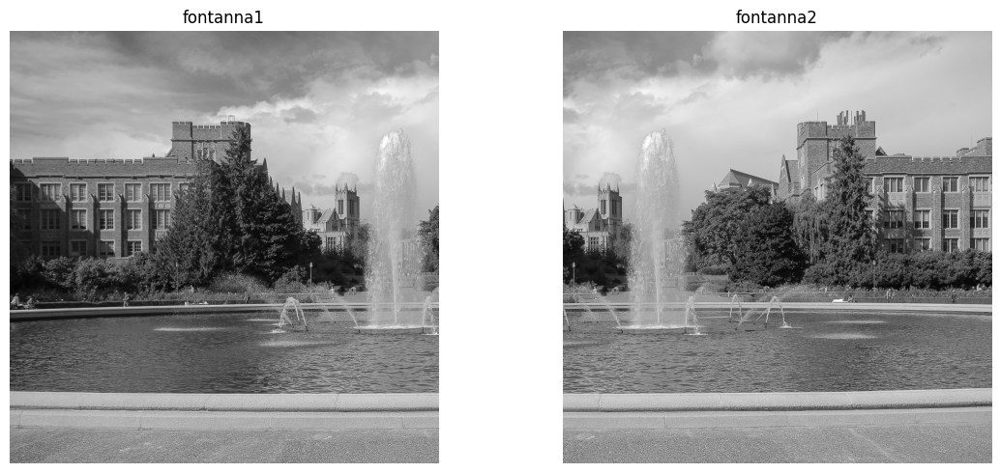

In [3]:
I_fountain1_gray = images_gray["fontanna1.jpg"]
I_fountain2_gray = images_gray["fontanna2.jpg"]

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(I_fountain1_gray, cmap='gray')
plt.title("fontanna1")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(I_fountain2_gray, cmap='gray')
plt.title("fontanna2")
plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
def harris_response(I_gray, kernel_size):
    k = 0.05
    I_gray = np.float32(I_gray)

    # Obliczenie pochodnych Sobela
    Ix = cv2.Sobel(I_gray, cv2.CV_32F, 1, 0, ksize=3)
    Iy = cv2.Sobel(I_gray, cv2.CV_32F, 0, 1, ksize=3)

    # Wyliczenie elementów macierzy M
    Ixx = Ix * Ix
    Iyy = Iy * Iy
    Ixy = Ix * Iy

    # Wygładzenie filtracją Gaussa
    Sxx = cv2.GaussianBlur(Ixx, (kernel_size, kernel_size), 0)
    Syy = cv2.GaussianBlur(Iyy, (kernel_size, kernel_size), 0)
    Sxy = cv2.GaussianBlur(Ixy, (kernel_size, kernel_size), 0)

    # Obliczenie wartości Harrisa
    detM = (Sxx * Syy) - (Sxy ** 2)
    traceM = Sxx + Syy
    H = detM - k * (traceM ** 2)

    # Normalizacja do przedziału [0, 1]
    H_norm = cv2.normalize(H, None, 0, 1, norm_type=cv2.NORM_MINMAX)

    return H_norm

In [ ]:
def find_max(image, size, threshold) : # size - maximum filter mask size
    data_max = filters.maximum_filter(image, size)
    maxima = (image == data_max)
    diff = image > threshold
    maxima[diff == 0] = 0
    return np.nonzero(maxima)

In [ ]:
def draw_corners(image, x_coords, y_coords, title):
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.plot(x_coords, y_coords, '*', color='red')
    plt.title(title)
    plt.axis("off")
    plt.show()

<ipython-input-45-856227dc2def>:2: DeprecationWarning: Please import `maximum_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  data_max = filters.maximum_filter(image, size)


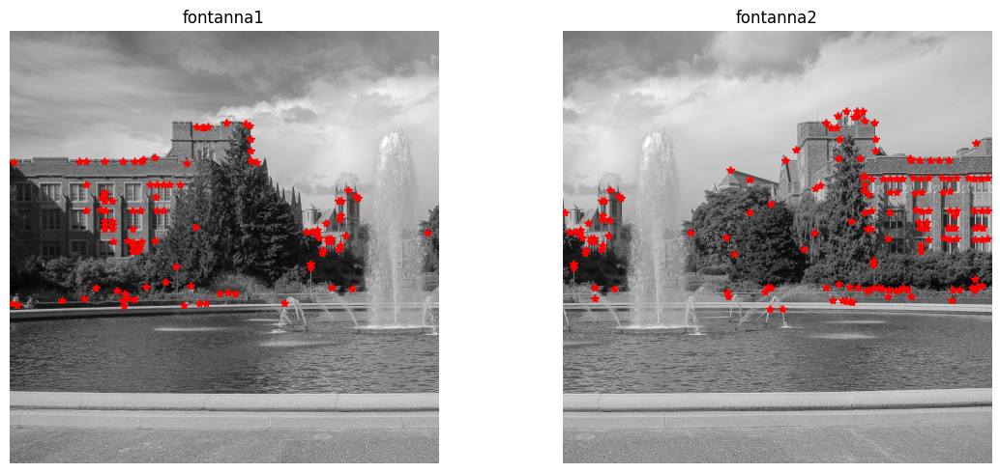

In [ ]:
threshold = 0.4
kernel_size = 7

H1 = harris_response(I_fountain1_gray, kernel_size)
H2 = harris_response(I_fountain2_gray, kernel_size)

y1, x1 = find_max(H1, kernel_size, threshold)
y2, x2 = find_max(H2, kernel_size, threshold)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(I_fountain1_gray, cmap='gray')
plt.plot(x1, y1, '*', color='red')
plt.title("fontanna1")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(I_fountain2_gray, cmap='gray')
plt.plot(x2, y2, '*', color='red')
plt.title("fontanna2")
plt.axis("off")

plt.tight_layout()
plt.show()


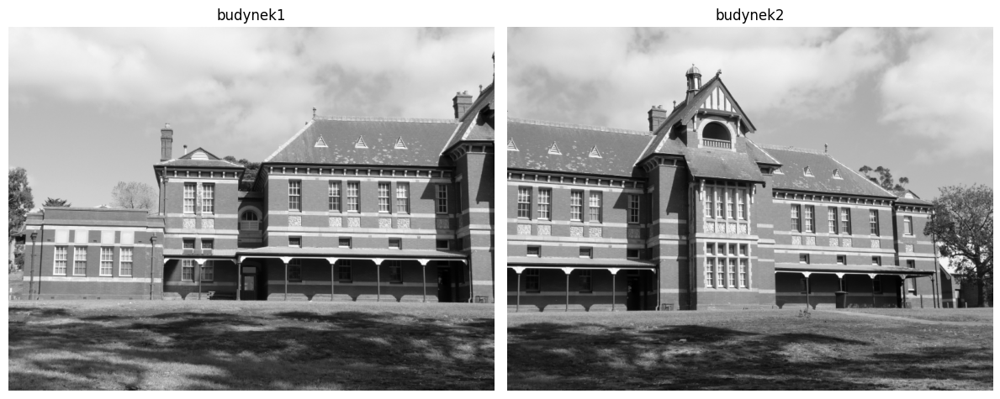

In [ ]:
I_building1_gray = images_gray["budynek1.jpg"]
I_building2_gray = images_gray["budynek2.jpg"]

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(I_building1_gray, cmap='gray')
plt.title("budynek1")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(I_building2_gray, cmap='gray')
plt.title("budynek2")
plt.axis("off")

plt.tight_layout()
plt.show()

<ipython-input-45-856227dc2def>:2: DeprecationWarning: Please import `maximum_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  data_max = filters.maximum_filter(image, size)


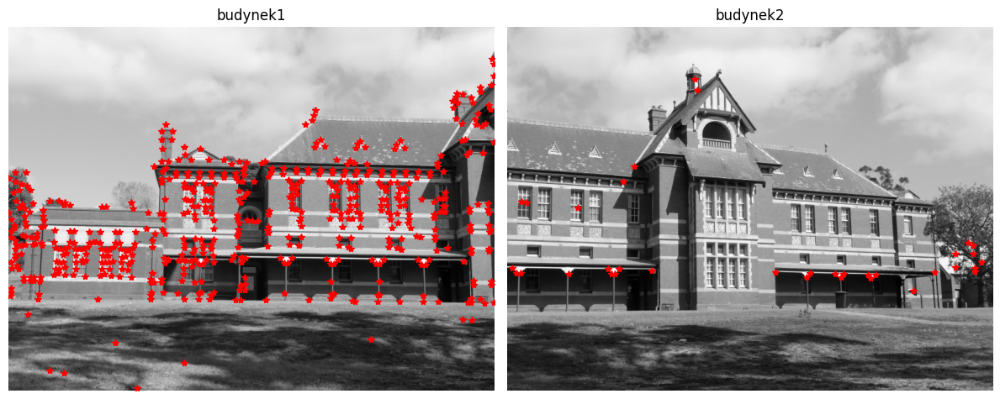

In [ ]:
threshold = 0.5
kernel_size = 7

H3 = harris_response(I_building1_gray, kernel_size)
H4 = harris_response(I_building2_gray, kernel_size)

y3, x3 = find_max(H3, kernel_size, threshold)
y4, x4 = find_max(H4, kernel_size, threshold)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(I_building1_gray, cmap='gray')
plt.plot(x3, y3, '*', color='red')
plt.title("budynek1")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(I_building2_gray, cmap='gray')
plt.plot(x4, y4, '*', color='red')
plt.title("budynek2")
plt.axis("off")

plt.tight_layout()
plt.show()

#6.2

In [ ]:
def extract_descriptors(image, keypoints, patch_size):
    descriptors = []
    half = patch_size // 2
    height, width = image.shape

    filtered_points = list(filter(
        lambda pt: half <= pt[1] < height - half and half <= pt[0] < width - half,
        zip(*keypoints)
    ))

    for x, y in filtered_points:
        patch = image[y - half:y + half + 1, x - half:x + half + 1]
        descriptors.append(patch.flatten())

    return descriptors, filtered_points


In [ ]:
def match_descriptors(descs1, coords1, descs2, coords2, max_matches):
    dists = cdist(descs1, descs2, metric='euclidean')

    matches = []
    for i in range(len(descs1)):
        j = np.argmin(dists[i])
        min_dist = dists[i, j]
        matches.append(((coords1[i][0], coords1[i][1]),
                        (coords2[j][0], coords2[j][1]),
                        min_dist))

    matches.sort(key=lambda x: x[2])
    return [(m[0], m[1]) for m in matches[:max_matches]]

In [ ]:
def process_and_match(img1_gray, img2_gray, threshold=0.5, kernel_size=7, patch_size=15, max_matches=20):
    # 1. Harris
    H1 = harris_response(img1_gray, kernel_size)
    H2 = harris_response(img2_gray, kernel_size)

    # 2. Lokalne maxima
    y1, x1 = find_max(H1, kernel_size, threshold)
    y2, x2 = find_max(H2, kernel_size, threshold)

    # 2. Ekstrakcja deskryptorów
    descriptors1, coords1 = extract_descriptors(img1_gray, (x1, y1), patch_size)
    descriptors2, coords2 = extract_descriptors(img2_gray, (x2, y2), patch_size)

    # 3. Dopasowanie
    matches = match_descriptors(descriptors1, coords1, descriptors2, coords2, max_matches=max_matches)

    # 4. Formatowanie do pm.plot_matches
    match_points = [[[y1, x1], [y2, x2]] for ((x1, y1), (x2, y2)) in matches]

    # 5. Wizualizacja
    pm.plot_matches(img1_gray, img2_gray, match_points)

In [ ]:
I_fontain_pow_gray = images_gray["fontanna_pow.jpg"]
I_eiffel1_gray = images_gray["eiffel1.jpg"]
I_eiffel2_gray = images_gray["eiffel2.jpg"]

<ipython-input-45-856227dc2def>:2: DeprecationWarning: Please import `maximum_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  data_max = filters.maximum_filter(image, size)


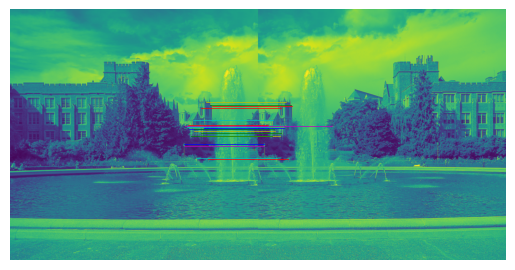

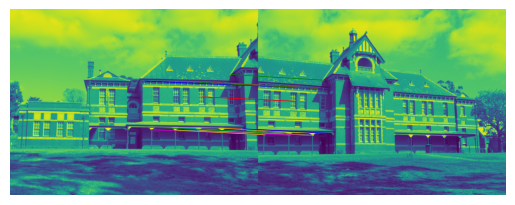

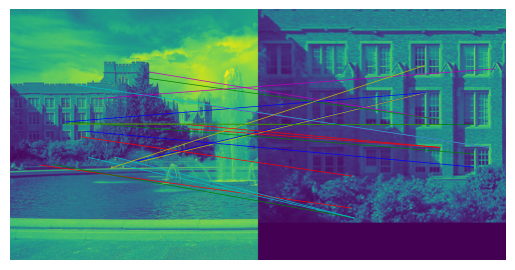

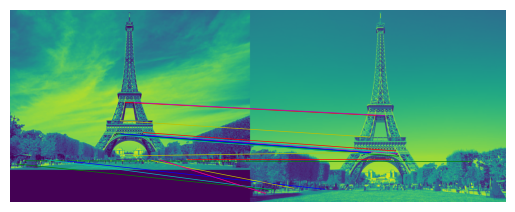

In [ ]:
process_and_match(I_fountain1_gray, I_fountain2_gray, threshold=0.4, kernel_size=7)
process_and_match(I_building1_gray, I_building2_gray, threshold=0.5, kernel_size=7)
process_and_match(I_fountain1_gray, I_fontain_pow_gray, threshold=0.5, kernel_size=7)
process_and_match(I_eiffel1_gray, I_eiffel2_gray, threshold=0.5, kernel_size=7)

In [ ]:
def extract_descriptors_normalized(image, keypoints, patch_size):
    descriptors = []
    half = patch_size // 2
    height, width = image.shape

    filtered_points = list(filter(
        lambda pt: half <= pt[1] < height - half and half <= pt[0] < width - half,
        zip(*keypoints)
    ))

    for x, y in filtered_points:
        patch = image[y - half:y + half + 1, x - half:x + half + 1]
        vec = patch.flatten().astype(np.float32)

        mean = np.mean(vec)
        std = np.std(vec)
        if std != 0:
            vec_normalized = (vec - mean) / std
        else:
            vec_normalized = vec - mean

        descriptors.append(vec_normalized)

    return descriptors, filtered_points


In [ ]:
def process_and_match_2(img1_gray, img2_gray, threshold=0.5, kernel_size=7, patch_size=15, max_matches=20):
    # 1. Harris
    H1 = harris_response(img1_gray, kernel_size)
    H2 = harris_response(img2_gray, kernel_size)

    # 2. Lokalne maxima
    y1, x1 = find_max(H1, kernel_size, threshold)
    y2, x2 = find_max(H2, kernel_size, threshold)

    # 2. Ekstrakcja deskryptorów
    descriptors1, coords1 = extract_descriptors_normalized(img1_gray, (x1, y1), patch_size)
    descriptors2, coords2 = extract_descriptors_normalized(img2_gray, (x2, y2), patch_size)

    # 3. Dopasowanie
    matches = match_descriptors(descriptors1, coords1, descriptors2, coords2, max_matches=max_matches)

    # 4. Formatowanie do pm.plot_matches
    match_points = [[[y1, x1], [y2, x2]] for ((x1, y1), (x2, y2)) in matches]

    # 5. Wizualizacja
    pm.plot_matches(img1_gray, img2_gray, match_points)

<ipython-input-6-856227dc2def>:2: DeprecationWarning: Please import `maximum_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  data_max = filters.maximum_filter(image, size)


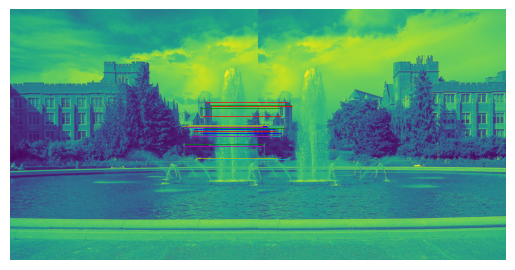

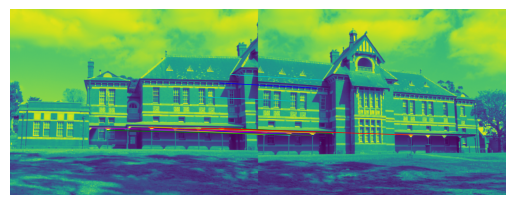

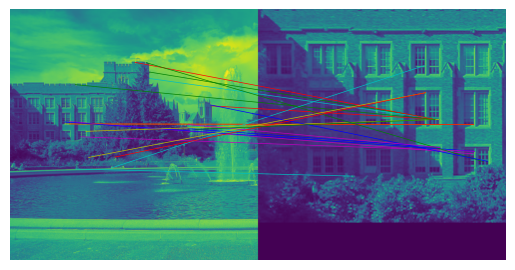

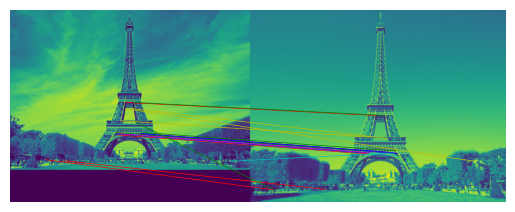

In [ ]:
process_and_match_2(I_fountain1_gray, I_fountain2_gray, threshold=0.4, kernel_size=7)
process_and_match_2(I_building1_gray, I_building2_gray, threshold=0.5, kernel_size=7)
process_and_match_2(I_fountain1_gray, I_fontain_pow_gray, threshold=0.5, kernel_size=7)
process_and_match_2(I_eiffel1_gray, I_eiffel2_gray, threshold=0.5, kernel_size=7)

#6.3

In [ ]:
def fast_detector_with_harris(image, threshold=30, n=9):
    image = image.astype(np.float32)
    height, width = image.shape
    corners = []

    # punkty na okręgu (zgodne z FAST – 16 pikseli)
    circle_offsets = [
        (0, -3), (1, -3), (2, -2), (3, -1),
        (3, 0), (3, 1), (2, 2), (1, 3),
        (0, 3), (-1, 3), (-2, 2), (-3, 1),
        (-3, 0), (-3, -1), (-2, -2), (-1, -3)
    ]

    # zakres, aby nie wyjść poza 7x7
    for y in range(3, height - 3):
        for x in range(3, width - 3):
            # jasność pixela centralnego i sąsiadów
            p = image[y, x]
            circle_vals = [image[y + dy, x + dx] for dx, dy in circle_offsets]

            # sprawdzenie warunku jansości
            brighter = [val > p + threshold for val in circle_vals]
            darker   = [val < p - threshold for val in circle_vals]

            # sprawdzenie ciągłych n
            def check_consecutive(flags):
                extended = flags * 2  # pozwala na zawijanie
                return any(sum(extended[i:i + n]) == n for i in range(len(flags)))

            # decyzja czy to punkt charakterystyczny
            if check_consecutive(brighter) or check_consecutive(darker):
                corners.append((x, y))

    return corners

In [ ]:
def non_maximum_suppression(points_with_scores, image_shape):
    """
    :param points_with_scores: lista (x, y, score)
    :param image_shape: kształt obrazu (wysokość, szerokość)
    return: lista (x, y, score) po NMS
    """

    height, width = image_shape
    suppression_map = np.zeros((height, width), dtype=np.float32)

    # wpisanie score dla kazdego punktu do mapy
    for x, y, score in points_with_scores:
        if 0 <= x < width and 0 <= y < height:
            suppression_map[y, x] = score

    # filtracja - zostają tylko punkty lokalnie maksymalne
    output = []
    for x, y, score in points_with_scores:
        x0, x1 = max(0, x - 1), min(width, x + 2)
        y0, y1 = max(0, y - 1), min(height, y + 2)
        local_patch = suppression_map[y0:y1, x0:x1]
        # jeśli pkt ma najwyższy score w otoczeniu to dodajemy do outputu
        # jeżeli nie to skip, bo obok jest punkt z wyższym score
        if score == np.max(local_patch):
            output.append((x, y, score))

    return output

In [ ]:
def filter_border_keypoints(points_with_scores, image_shape, patch_size=31):
    """
    :param points_with_scores: lista (x, y, score)
    :param image_shape: (wysokość, szerokość)
    :param patch_size: rozmiar wycinka (np. 31)
    :return: lista (x, y, score) tylko tych punktów, które mają pełne otoczenie
    """

    height, width = image_shape
    margin = patch_size // 2

    filtered = [
        (x, y, score)
        for (x, y, score) in points_with_scores
        if margin <= x < width - margin and margin <= y < height - margin
    ]
    return filtered

In [ ]:
def select_top_keypoints(points_with_scores, top_n):
    """
    :param points_with_scores: lista (x, y, score)
    :param top_n: ile punktów chcesz zostawić
    :return: lista (x, y, score) – top N punktów o najwyższej wartości score
    """
    sorted_points = sorted(points_with_scores, key=lambda pt: pt[2], reverse=True)
    return sorted_points[:top_n]

In [ ]:
def compute_orientations(image, keypoints, patch_size=31):
    """
    :param image: obraz w skali szarości
    :param keypoints: lista (x, y, score)
    :param patch_size: rozmiar otoczenia (domyślnie 31x31)
    :return: lista (x, y, angle) – kąt w radianach
    """
    half = patch_size // 2
    orientations = []

    for x, y, _ in keypoints:
        patch = image[y - half:y + half + 1, x - half:x + half + 1]
        I = patch.astype(np.float32)

        # współrzędne lokalne (0,0) w środku patcha
        coords = np.arange(-half, half + 1)
        xx, yy = np.meshgrid(coords, coords)

        m00 = np.sum(I)
        if m00 == 0:
            angle = 0.0
        else:
            m10 = np.sum(xx * I)
            m01 = np.sum(yy * I)
            angle = np.arctan2(m01, m10)

        orientations.append((x, y, angle))

    return orientations

In [ ]:
def compute_brief_descriptors(image, keypoints_with_angles, pairs, patch_size=31):
    """
    Tworzy deskryptory BRIEF (256-bit) dla podanych punktów z orientacją.

    :param image: obraz po rozmyciu (gauss 5x5)
    :param keypoints_with_angles: lista (x, y, angle)
    :param pairs: np.array Nx4: x1, y1, x2, y2 – N par punktów
    :return: lista deskryptorów (np.array z wartościami 0/1)
    """
    half = patch_size // 2
    descriptors = []

    for x, y, angle in keypoints_with_angles:
        patch = image[y - half:y + half + 1, x - half:x + half + 1]
        I = patch.astype(np.float32)

        cos_a = np.cos(angle)
        sin_a = np.sin(angle)

        desc = []

        for (x1, y1, x2, y2) in pairs:
            # Obracamy względem kąta orientacji punktu
            u1x = int(round(cos_a * x1 - sin_a * y1 + half))
            u1y = int(round(sin_a * x1 + cos_a * y1 + half))
            u2x = int(round(cos_a * x2 - sin_a * y2 + half))
            u2y = int(round(sin_a * x2 + cos_a * y2 + half))

            # Sprawdzenie, czy punkty są w granicach patcha
            if 0 <= u1x < patch_size and 0 <= u1y < patch_size and \
               0 <= u2x < patch_size and 0 <= u2y < patch_size:
                p1 = I[u1y, u1x]
                p2 = I[u2y, u2x]
                desc.append(1 if p1 < p2 else 0)
            else:
                desc.append(0)  # lub pominąć/dodać losowo

        descriptors.append(desc)

    return np.array(descriptors, dtype=np.uint8)

In [ ]:
def match_brief_descriptors(desc1, coords1, desc2, coords2, max_matches=100):
    """
    Porównuje deskryptory BRIEF z dwóch obrazów i zwraca max_matches najlepszych dopasowań.

    :param desc1: lista deskryptorów z obrazu 1 (N x 256)
    :param coords1: lista (x, y) punktów z obrazu 1
    :param desc2: lista deskryptorów z obrazu 2 (M x 256)
    :param coords2: lista (x, y) punktów z obrazu 2
    :return: lista dopasowań [((x1, y1), (x2, y2)) ...]
    """
    matches = []

    for i, d1 in enumerate(desc1):
        best_dist = 257  # więcej niż max 256-bitowa odległość
        best_j = -1
        for j, d2 in enumerate(desc2):
            dist = np.sum(d1 != d2)  # Hamming distance
            if dist < best_dist:
                best_dist = dist
                best_j = j

        matches.append((coords1[i], coords2[best_j], best_dist))

    # Sortujemy po odległości Hamminga (im mniejsza, tym lepsze dopasowanie)
    matches.sort(key=lambda m: m[2])

    # Zwracamy tylko współrzędne
    return [((x1, y1), (x2, y2)) for (x1, y1), (x2, y2), _ in matches[:max_matches]]


In [ ]:
def orb_pipeline(image1_gray, image2_gray, max_matches=20, top_n=250):
    # Etap 1: Harris i FAST
    H1 = harris_response(image1_gray, 3)
    H2 = harris_response(image2_gray, 3)

    fast1 = fast_detector_with_harris(image1_gray)
    fast2 = fast_detector_with_harris(image2_gray)

    pts1 = [(x, y, H1[y, x]) for x, y in fast1]
    pts2 = [(x, y, H2[y, x]) for x, y in fast2]

    # Etap 2: NMS
    nms1 = non_maximum_suppression(pts1, image1_gray.shape)
    nms2 = non_maximum_suppression(pts2, image2_gray.shape)

    # Etap 3: filtracja brzegów
    clean1 = filter_border_keypoints(nms1, image1_gray.shape, patch_size=31)
    clean2 = filter_border_keypoints(nms2, image2_gray.shape, patch_size=31)

    # Etap 4: wybór N najlepszych
    top1 = select_top_keypoints(clean1, top_n)
    top2 = select_top_keypoints(clean2, top_n)

    # Etap 5: orientacje
    ori1 = compute_orientations(image1_gray, top1, patch_size=31)
    ori2 = compute_orientations(image2_gray, top2, patch_size=31)

    # Etap 6: BRIEF
    pairs = np.loadtxt('orb_descriptor_positions.txt').astype(np.int32)
    blur1 = cv2.GaussianBlur(image1_gray, (5, 5), 0)
    blur2 = cv2.GaussianBlur(image2_gray, (5, 5), 0)

    desc1 = compute_brief_descriptors(blur1, ori1, pairs)
    desc2 = compute_brief_descriptors(blur2, ori2, pairs)

    coords1 = [(x, y) for x, y, _ in ori1]
    coords2 = [(x, y) for x, y, _ in ori2]

    # Etap 7: Dopasowanie
    matches = match_brief_descriptors(desc1, coords1, desc2, coords2, max_matches=max_matches)

    # Etap 8: Wizualizacja
    match_points = [[[y1, x1], [y2, x2]] for ((x1, y1), (x2, y2)) in matches]
    pm.plot_matches(image1_gray, image2_gray, match_points)

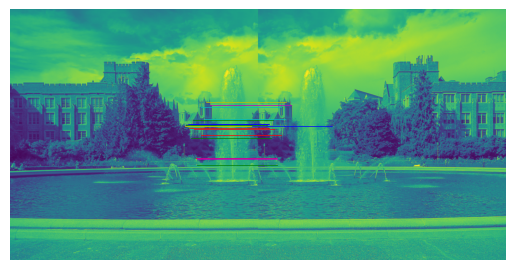

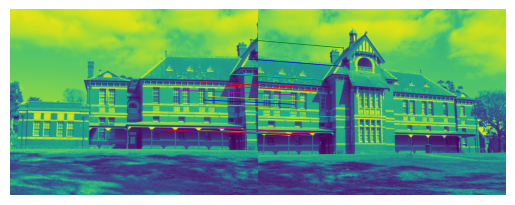

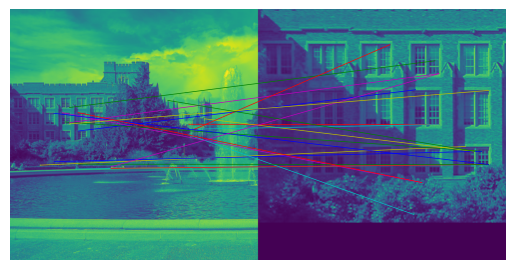

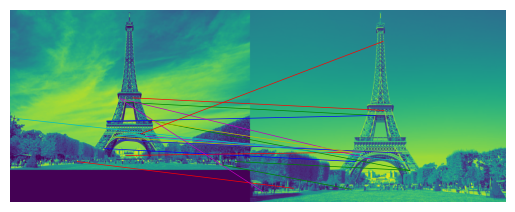

In [ ]:
orb_pipeline(I_fountain1_gray, I_fountain2_gray, max_matches=20, top_n=200)
orb_pipeline(I_building1_gray, I_building2_gray, max_matches=20, top_n=200)
orb_pipeline(I_fountain1_gray, I_fontain_pow_gray, max_matches=20, top_n=200)
orb_pipeline(I_eiffel1_gray, I_eiffel2_gray, max_matches=20, top_n=200)

#6.4

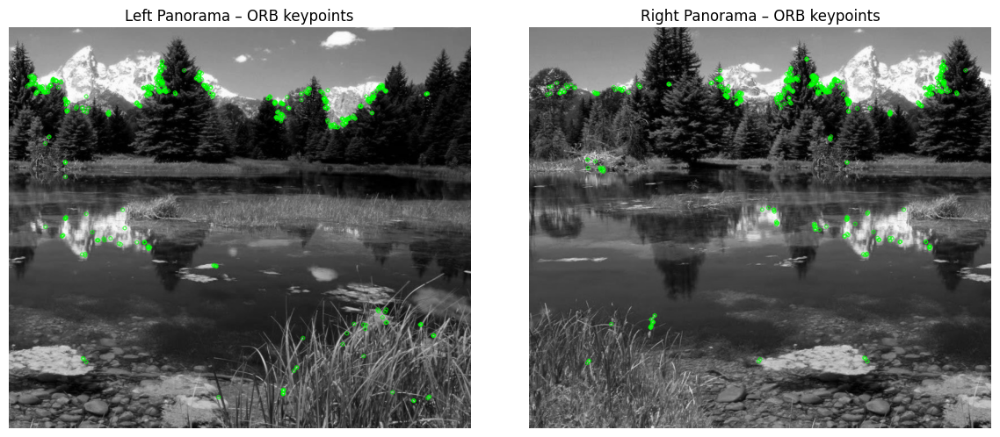

In [ ]:
I_left_panorama_gray = images_gray["left_panorama.jpg"]
I_right_panorama_gray = images_gray["right_panorama.jpg"]

# Stworzenie detektora ORB
orb = cv2.ORB_create(nfeatures=500)

# Wykrycie punktów (bez obliczania deskryptorów)
kp_left = orb.detect(I_left_panorama_gray, None)
kp_right = orb.detect(I_right_panorama_gray, None)

# Narysowanie punktów
img_left_kp = cv2.drawKeypoints(I_left_panorama_gray, kp_left, None, color=(0,255,0), flags=0)
img_right_kp = cv2.drawKeypoints(I_right_panorama_gray, kp_right, None, color=(0,255,0), flags=0)

plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.imshow(img_left_kp)
plt.title("Left Panorama – ORB keypoints")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_right_kp)
plt.title("Right Panorama – ORB keypoints")
plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
def match_and_draw_orb(img1_gray, img2_gray, max_features=500, top_n=100):
    orb = cv2.ORB_create(nfeatures=max_features)
    kp1, desc1 = orb.detectAndCompute(img1_gray, None)
    kp2, desc2 = orb.detectAndCompute(img2_gray, None)

    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches = bf.match(desc1, desc2)

    # Sortujemy po odległości (im mniejsza, tym lepiej)
    matches = sorted(matches, key=lambda m: m.distance)

    # Wybieramy top N najlepszych dopasowań
    best_matches = matches[:top_n]

    return best_matches, kp1, kp2


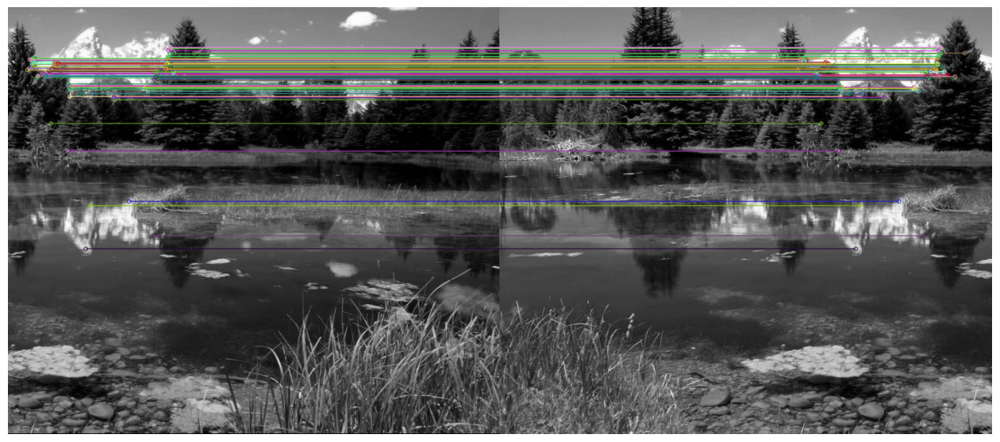

In [ ]:
best_matches, kp1, kp2 = match_and_draw_orb(I_left_panorama_gray, I_right_panorama_gray)

result = cv2.drawMatches(I_left_panorama_gray, kp1, I_right_panorama_gray, kp2, best_matches, None,
                         flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# 3. Wyświetlenie
plt.figure(figsize=(16, 8))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [ ]:
def compute_homography(matches, kp1, kp2):
    ptsA = np.float32([kp1[m.queryIdx].pt for m in matches])
    ptsB = np.float32([kp2[m.trainIdx].pt for m in matches])

    H, mask = cv2.findHomography(ptsA, ptsB, cv2.RANSAC)
    return H

In [ ]:
def warp_and_blend(image_left, image_right, H):
    # rozmiar wynikowego obrazu (łączymy poziomo)
    width = image_left.shape[1] + image_right.shape[1]
    height = max(image_left.shape[0], image_right.shape[0])

    # przekształcamy lewy obraz według homografii
    result = cv2.warpPerspective(image_left, H, (width, height))

    # wklejamy prawy obraz do wynikowego
    result[0:image_right.shape[0], 0:image_right.shape[1]] = image_right
    return result


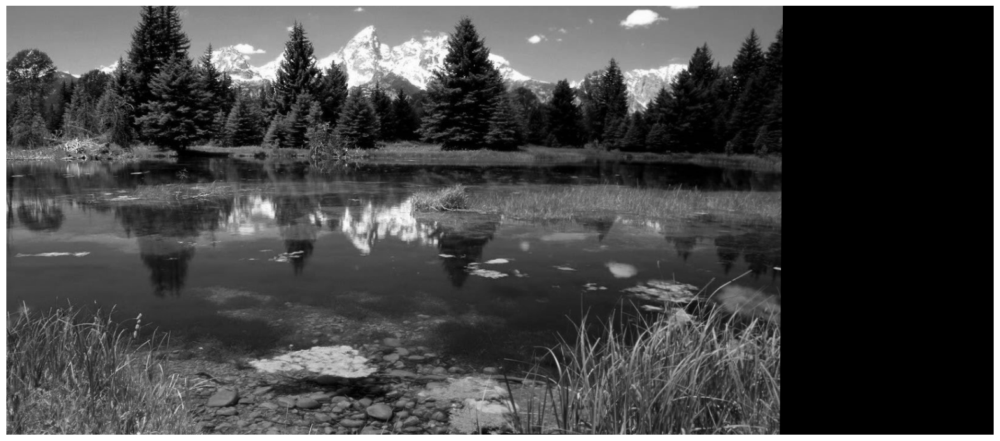

In [ ]:
# 1. Dopasowanie i punkty
best_matches, kp1, kp2 = match_and_draw_orb(I_left_panorama_gray, I_right_panorama_gray)

# 2. Homografia
H = compute_homography(best_matches, kp1, kp2)

# 3. Połączenie obrazów
result = warp_and_blend(I_left_panorama_gray, I_right_panorama_gray, H)

plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [ ]:
def crop_black_borders(image):
    mask = image > 0
    coords = np.argwhere(mask)

    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1

    return image[y0:y1, x0:x1]

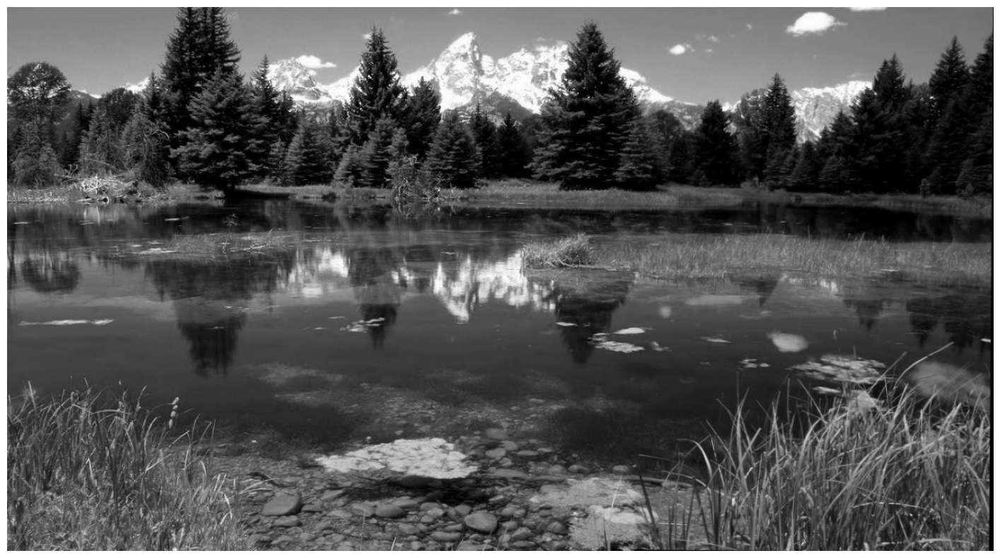

In [ ]:
# 4. Usunięcie czarnego tła
cropped_result = crop_black_borders(result)

# 5. Wyświetlenie
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(cropped_result, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

#6.5

In [ ]:
def match_sift_features(img1_gray, img2_gray, ratio_thresh=0.5):
    # Detektor SIFT
    sift = cv2.SIFT_create()

    # Wykrycie punktów i deskryptorów
    kp1, desc1 = sift.detectAndCompute(img1_gray, None)
    kp2, desc2 = sift.detectAndCompute(img2_gray, None)

    # BFMatcher z metryką L2 (dla SIFT/SURF)
    bf = cv2.BFMatcher(cv2.NORM_L2)
    matches = bf.knnMatch(desc1, desc2, k=2)

    # Filtr Lowe’a: najlepszy musi być wyraźnie lepszy niż drugi
    best_matches = [m for m, n in matches if m.distance < ratio_thresh * n.distance]

    return best_matches, kp1, kp2


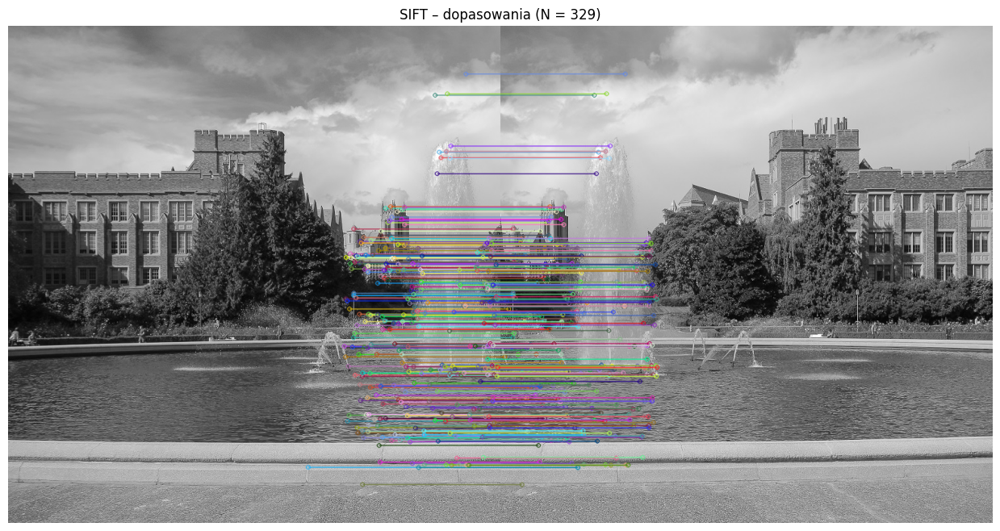

In [ ]:
# Fontanna1 vs Fontanna2 (lub inne)
matches, kp1, kp2 = match_sift_features(I_fountain1_gray, I_fountain2_gray)

# Rysowanie dopasowań
result = cv2.drawMatches(I_fountain1_gray, kp1, I_fountain2_gray, kp2, matches, None,
                         flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(16, 8))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title(f"SIFT – dopasowania (N = {len(matches)})")
plt.axis("off")
plt.show()
